## Transcriptome Harmonization EDA

### Imports

In [375]:
from imports import * 

In [376]:
# overall imports
import importlib
import data

# data load
from data.data_load import load_transcriptome, load_connectome
importlib.reload(data.data_load)

importlib.reload(harmonize.harmonizer)

import harmonize.harmonizer
from harmonize.harmonizer import Harmonizer
importlib.reload(harmonize.harmonizer)


<module 'harmonize.harmonizer' from '/scratch/asr655/neuroinformatics/GeneEx2Conn/harmonize/harmonizer.py'>

- [Class test](#class_test)

### Action items description: 
(then want to create a function that maps each sample to a broader network using the atlas_info folder - this needs to return a new df to work with...)
(then want to create a processor that uses pycombat)
(then want to create an evaluator for KLD, mean, variance etc. for regions that are well represented across many datasets)
(then want to create an evaluator using scib)

(tests with AHBA raw?)


### Paths

In [303]:
par_dir = os.path.abspath(os.path.join(os.getcwd(), os.pardir))
data_dir = par_dir + '/data'
samples_dir = data_dir + '/samples_files'


In [304]:
csv_paths = [samples_dir + '/' + f for f in os.listdir(samples_dir) if f.endswith('.csv')]
print(csv_paths)

['/scratch/asr655/neuroinformatics/data/samples_files/UTSW_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/AHBA_raw_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/GTEx_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/HBT_Brainspan_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/CBB_samples.csv', '/scratch/asr655/neuroinformatics/data/samples_files/AHBA_srs_samples.csv']


In [305]:
# manually remove any csv_paths if necessary
csv_paths= ['/scratch/asr655/neuroinformatics/data/samples_files/AHBA_raw_samples.csv',
            '/scratch/asr655/neuroinformatics/data/samples_files/HBT_samples.csv', 
            '/scratch/asr655/neuroinformatics/data/samples_files/UTSW_samples.csv',        
            '/scratch/asr655/neuroinformatics/data/samples_files/GTEx_samples.csv', 
            '/scratch/asr655/neuroinformatics/data/samples_files/HBT_Brainspan_samples.csv', 
            '/scratch/asr655/neuroinformatics/data/samples_files/CBB_samples.csv']


In [306]:
for txt_file in os.listdir(data_dir + '/genelist_files'): 
    print(txt_file)

gene_list 6.txt
gene_list.txt
gene_list 4.txt
gene_list 5.txt
gene_list 2.txt
gene_list 3.txt


#### Evaluate gene overlap across datasets


In [307]:
def find_gene_intersection(data_dir):
    # Initialize a set to store the intersection of genes
    gene_intersection = None

    # Iterate over each txt file in the directory
    for txt_file in os.listdir(data_dir):
        # Check if the file is a txt file
        if txt_file.endswith('.txt'):
            # Read the gene list from the file
            with open(os.path.join(data_dir, txt_file), 'r') as file:
                gene_set = set(file.read().splitlines())

                # If it's the first file, start the intersection with this set
                if gene_intersection is None:
                    gene_intersection = gene_set
                else:
                    # Intersect with the current set of genes
                    gene_intersection &= gene_set

    # If there are no intersecting genes, handle it appropriately
    if gene_intersection is None:
        return set(), 0

    # Return the intersecting genes and their count
    return gene_intersection, len(gene_intersection)

# Example usage
intersecting_genes, gene_count = find_gene_intersection(data_dir + '/genelist_files')
print(gene_count, 'overlapping genes')

10605 overlapping genes


### Clean metadata

In [308]:
def clean_csv_metadata(csv_path): 
    """
    Function to categorize sex, age, ethnicity if possible,
    retain only overlapping genes, and create an age decade column.
    """
    dataset_df = pd.read_csv(csv_path)

    # Keep only the first 2 characters in the age column (assumed to be the numeric part)
    dataset_df['age'] = dataset_df['age'].astype(str).str[:2].astype(int)  # Convert to int after slicing

    # Create the age decade column
    def assign_age_decade(age):
        if age >= 10:
            return f'{age // 10 * 10}-{age // 10 * 10 + 9}'
        else:
            return '0-9'  # Handle very young ages, if any
    
    dataset_df['age decade'] = dataset_df['age'].apply(assign_age_decade)
    
     # Move the 'age_decade' column right after 'age'
    age_idx = dataset_df.columns.get_loc('age')
    cols = dataset_df.columns.tolist()
    cols.insert(age_idx + 1, cols.pop(cols.index('age decade')))
    dataset_df = dataset_df[cols]  # Reorder the columns
    # Map sex: make M=1, F=2
    dataset_df['sex'] = dataset_df['sex'].replace({1: 'M', 2: 'F'})

    # Placeholder for ethnicity processing (you can add more entries to ethnicity_dict later)
    ethnicities = ['Caucasian', 'Hispanic', 'African', 'African American', 'Asian', 'Caribbean', 'Middle Eastern']
    ethnicity_dict = {'Caucasian': ['Caucasian', 'European']}

    # Dynamically find where metadata ends and gene columns start
    metadata_end_column = 'sequencing_type'
    metadata_columns = dataset_df.columns[:dataset_df.columns.get_loc(metadata_end_column) + 1].tolist()

    # Find the intersecting genes that are present in the DataFrame and sort them alphabetically
    gene_columns = [col for col in dataset_df.columns if col not in metadata_columns and col in intersecting_genes]
    sorted_gene_columns = sorted(gene_columns)

    # Combine metadata columns with the sorted gene columns
    cols_to_keep = metadata_columns + sorted_gene_columns

    # Filter the DataFrame to keep only the necessary columns
    dataset_df = dataset_df[cols_to_keep]
    
    print(dataset_df.head())  # For debugging purposes, can be removed later
    sample_dfs.append(dataset_df)

sample_dfs = []

for csv in csv_paths:
    clean_csv_metadata(csv)

      ID  age age decade sex  ethnicity tissue sample local name  \
0  12876   57      50-59   M  Caucasian                 LH_Vis_1   
1  12876   57      50-59   M  Caucasian                 LH_Vis_2   
2  12876   57      50-59   M  Caucasian                 LH_Vis_3   
3  12876   57      50-59   M  Caucasian                 LH_Vis_4   
4  12876   57      50-59   M  Caucasian                 LH_Vis_5   

  tissue sample(s) in atlas name          atlas        centroid coordinates  \
0                       LH_Vis_1  SchaefSubcort  [(-25.82, -32.62, -17.46)]   
1                       LH_Vis_2  SchaefSubcort  [(-25.48, -76.59, -13.51)]   
2                       LH_Vis_3  SchaefSubcort   [(-16.42, -60.96, -6.74)]   
3                       LH_Vis_4  SchaefSubcort   [(-27.13, -94.49, -4.74)]   
4                       LH_Vis_5  SchaefSubcort    [(-6.23, -92.46, -3.04)]   

  dataset  ...      ZW10    ZWILCH     ZWINT      ZXDA      ZXDB      ZXDC  \
0    AHBA  ...  5.283034  5.341874  5.

In [336]:
# combine datasets into one main dataframe
combined_df = pd.concat(sample_dfs, axis=0, ignore_index=True)
threshold = int(combined_df.shape[1] * 0.5)  # drop null rows
combined_df = combined_df.dropna(thresh=threshold)
print(combined_df.shape)

(3754, 10616)


In [337]:
combined_df.head()

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,dataset,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,12876,57,50-59,M,Caucasian,LH_Vis_1,LH_Vis_1,SchaefSubcort,"[(-25.82, -32.62, -17.46)]",AHBA,...,5.283034,5.341874,5.398034,5.767831,6.455977,6.151167,8.373010,7.407867,8.606017,6.671347
1,12876,57,50-59,M,Caucasian,LH_Vis_2,LH_Vis_2,SchaefSubcort,"[(-25.48, -76.59, -13.51)]",AHBA,...,4.346258,5.253206,4.177842,5.236142,6.508071,6.224455,8.291283,7.226644,8.494112,6.299844
2,12876,57,50-59,M,Caucasian,LH_Vis_3,LH_Vis_3,SchaefSubcort,"[(-16.42, -60.96, -6.74)]",AHBA,...,5.545546,5.532174,5.257217,5.769525,6.678535,6.166067,8.605987,7.991383,9.018510,6.636720
5,12876,57,50-59,M,Caucasian,LH_Vis_6,LH_Vis_6,SchaefSubcort,"[(-12.7, -64.96, 5.79)]",AHBA,...,5.368037,5.313713,5.076367,5.849769,6.674685,6.392912,8.470277,8.266661,9.285791,6.449373
6,12876,57,50-59,M,Caucasian,LH_Vis_7,LH_Vis_7,SchaefSubcort,"[(-47.04, -70.82, 10.52)]",AHBA,...,5.250711,5.100629,4.849593,5.735342,6.598822,6.342421,8.604411,7.771096,9.152989,6.614026


#### Compute macro region from centroid coordinates

In [338]:
# List of regions to be labeled as 'Subcortical Microstructure'
subcortical_microstructure_regions = [
    'LH-GPe', 'LH-GPi', 'LH-VeP', 'LH-HTH', 'LH-SNc_PBP_VTA', 'LH-RN', 'LH-SNr',
    'RH-GPe', 'RH-GPi', 'RH-RN', 'RH-SNr', 'RH-HTH', 'RH-MN', 'RH-SNc_PBP_VTA',
    'Hypothalamus', 'Substantia nigra', 'Globus Pallidus', 'Internal Capsule', 'Substantia Nigra'
]

# Function to map MNI region from coordinates
def get_mni_region_from_coords(coords, mni_data, affine, mni_label_map):
    """
    Given a list of coordinates, determine the most frequent MNI macro region.
    If no match is found, use the closest XML centroid.
    
    Args:
        coords (list of tuples): List of 3D MNI coordinates.
        mni_data (numpy array): The loaded MNI atlas data.
        affine (numpy array): Affine transformation matrix from the NIfTI file.
        mni_label_map (dict): Dictionary mapping MNI ROI values to labels.

    Returns:
        str: Most frequent MNI region label.
    """
    regions = []
    
    for coord in coords:
        if coord is None:
            continue  # Skip if the coordinate is None

        # Transform MNI coordinates to voxel indices using the affine
        voxel_coord = nib.affines.apply_affine(np.linalg.inv(affine), coord)
        voxel_coord = np.round(voxel_coord).astype(int)

        # Ensure the voxel coordinates are within the MNI data bounds
        if (0 <= voxel_coord[0] < mni_data.shape[0] and
            0 <= voxel_coord[1] < mni_data.shape[1] and
            0 <= voxel_coord[2] < mni_data.shape[2]):
            region_value = mni_data[tuple(voxel_coord)]
            region_label = mni_label_map.get(int(region_value), None)
            
            # If a region label is found in the MNI data, add it
            if region_label:
                regions.append(region_label)
            else:
                continue  # Skip unknown values in MNI data
        else:
            continue  # Skip out-of-bounds coordinates

    if regions:
        most_common_region = Counter(regions).most_common(1)[0][0]
        return most_common_region
    else:
        return 'Unknown'

# Function to assign macro regions based on centroid coordinates
def assign_macro_regions(combined_df, mni_data, affine, mni_label_map):
    """
    Assign a macro brain region to each sample based on centroid coordinates.
    
    Args:
        combined_df (pd.DataFrame): DataFrame containing the centroid coordinates.
        mni_data (numpy array): The loaded MNI atlas data.
        affine (numpy array): Affine transformation matrix from the NIfTI file.
        mni_label_map (dict): Dictionary mapping MNI ROI values to labels.
        
    Returns:
        pd.DataFrame: Updated DataFrame with the macro region column added.
    """
    # Create a new column to store the macro regions
    macro_regions = []

    for idx, row in combined_df.iterrows():
        centroid_coords = row['centroid coordinates']
        tissue_local_name = row['tissue sample local name']

        if centroid_coords is not None:
            if isinstance(centroid_coords, str):
                centroid_coords = eval(centroid_coords)
            
            if isinstance(centroid_coords, list):
                valid_coords = [coord for coord in centroid_coords if coord is not None]
                
                if valid_coords:
                    macro_region = get_mni_region_from_coords(valid_coords, mni_data, affine, mni_label_map)
                    if macro_region == 'Unknown' and tissue_local_name in subcortical_microstructure_regions:
                        macro_region = 'Subcortical Microstructure'
                else:
                    macro_region = 'Unknown'
            else:
                macro_region = 'Unknown'
        else:
            # Check if the local tissue name falls under the subcortical microstructure regions
            if tissue_local_name in subcortical_microstructure_regions:
                macro_region = 'Subcortical Microstructure'
            else:
                macro_region = 'Unknown'
        
        macro_regions.append(macro_region)

    # Insert the macro region column into the DataFrame after the centroid coordinates column
    combined_df.insert(combined_df.columns.get_loc('centroid coordinates') + 1, 'macro region', macro_regions)
    
    return combined_df

In [339]:
import nibabel as nib

# Sample usage
mni_nifti_path = data_dir+'/atlas_info/MNI-maxprob-thr0-1mm.nii'
mni_xml_path = '/path_to_mni_atlas/MNI.xml'

# Load the MNI atlas and the label mapping (you'll need to parse the MNI.xml to get this mapping)
mni_data, affine = load_mni_atlas(mni_nifti_path)

# Add the MNI region mapping based on the MNI.xml file.
mni_label_map = {
    1:'Caudate',
    2:'Cerebellum',
    3:'Frontal Lobe',
    4:'Insula',
    5:'Occipital Lobe',
    6:'Parietal Lobe',
    7:'Putamen',
    8:'Temporal Lobe',
    9:'Thalamus'
}

# Assign macro regions to the combined_df
combined_df = assign_macro_regions(combined_df, mni_data, affine, mni_label_map)

# Show the updated DataFrame with the macro region column
print(combined_df.head())

      ID  age age decade sex  ethnicity tissue sample local name  \
0  12876   57      50-59   M  Caucasian                 LH_Vis_1   
1  12876   57      50-59   M  Caucasian                 LH_Vis_2   
2  12876   57      50-59   M  Caucasian                 LH_Vis_3   
5  12876   57      50-59   M  Caucasian                 LH_Vis_6   
6  12876   57      50-59   M  Caucasian                 LH_Vis_7   

  tissue sample(s) in atlas name          atlas        centroid coordinates  \
0                       LH_Vis_1  SchaefSubcort  [(-25.82, -32.62, -17.46)]   
1                       LH_Vis_2  SchaefSubcort  [(-25.48, -76.59, -13.51)]   
2                       LH_Vis_3  SchaefSubcort   [(-16.42, -60.96, -6.74)]   
5                       LH_Vis_6  SchaefSubcort     [(-12.7, -64.96, 5.79)]   
6                       LH_Vis_7  SchaefSubcort   [(-47.04, -70.82, 10.52)]   

     macro region  ...      ZW10    ZWILCH     ZWINT      ZXDA      ZXDB  \
0   Temporal Lobe  ...  5.283034  5.3418

In [340]:
# Count the number of 'Unknown' entries in the 'macro region' column
unknown_count = combined_df[combined_df['macro region'] == 'Unknown'].shape[0]
print(f"Number of 'Unknown' entries in 'macro region': {unknown_count}")

# Retrieve the 'tissue sample local name' values corresponding to the 'Unknown' entries
unknown_tissues = combined_df.loc[combined_df['macro region'] == 'Unknown', 'tissue sample local name']
print("Tissue sample local names corresponding to 'Unknown' macro regions:")
print(unknown_tissues.tolist())


Number of 'Unknown' entries in 'macro region': 4
Tissue sample local names corresponding to 'Unknown' macro regions:
['Internal Capsule', 'Internal Capsule', 'Internal Capsule', 'Internal Capsule']


In [341]:
combined_df.head(5)

,ID,age,age decade,sex,ethnicity,tissue sample local name,tissue sample(s) in atlas name,atlas,centroid coordinates,macro region,...,ZW10,ZWILCH,ZWINT,ZXDA,ZXDB,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
0,12876,57,50-59,M,Caucasian,LH_Vis_1,LH_Vis_1,SchaefSubcort,"[(-25.82, -32.62, -17.46)]",Temporal Lobe,...,5.283034,5.341874,5.398034,5.767831,6.455977,6.151167,8.373010,7.407867,8.606017,6.671347
1,12876,57,50-59,M,Caucasian,LH_Vis_2,LH_Vis_2,SchaefSubcort,"[(-25.48, -76.59, -13.51)]",Occipital Lobe,...,4.346258,5.253206,4.177842,5.236142,6.508071,6.224455,8.291283,7.226644,8.494112,6.299844
2,12876,57,50-59,M,Caucasian,LH_Vis_3,LH_Vis_3,SchaefSubcort,"[(-16.42, -60.96, -6.74)]",Occipital Lobe,...,5.545546,5.532174,5.257217,5.769525,6.678535,6.166067,8.605987,7.991383,9.018510,6.636720
5,12876,57,50-59,M,Caucasian,LH_Vis_6,LH_Vis_6,SchaefSubcort,"[(-12.7, -64.96, 5.79)]",Occipital Lobe,...,5.368037,5.313713,5.076367,5.849769,6.674685,6.392912,8.470277,8.266661,9.285791,6.449373
6,12876,57,50-59,M,Caucasian,LH_Vis_7,LH_Vis_7,SchaefSubcort,"[(-47.04, -70.82, 10.52)]",Occipital Lobe,...,5.250711,5.100629,4.849593,5.735342,6.598822,6.342421,8.604411,7.771096,9.152989,6.614026


#### Sampling density plot

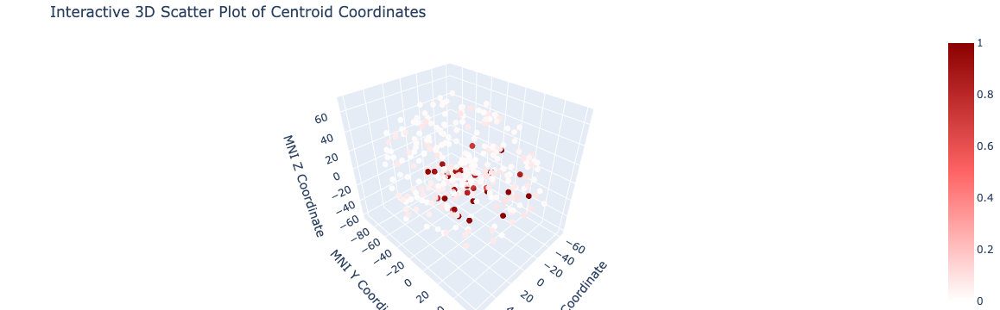

In [321]:
# Function to convert the string to a list of tuples
def parse_centroid_coordinates(coord_string):
    try:
        # Safely evaluate the string to a Python list
        return ast.literal_eval(coord_string)
    except (SyntaxError, ValueError):
        return None

# Extract all the centroid coordinates, converting strings to lists of tuples
all_coords = []

for coord_string in combined_df['centroid coordinates']:
    if coord_string and isinstance(coord_string, str):
        coords_list = parse_centroid_coordinates(coord_string)
        if coords_list is not None:
            # Filter out any None values within the coords_list
            valid_coords = [coord for coord in coords_list if coord is not None]
            all_coords.extend(valid_coords)

# Convert the list of tuples into a NumPy array for easier processing
coords_array = np.array(all_coords)

# Create a Counter object to count occurrences of each coordinate
coords_counter = Counter(map(tuple, coords_array))

# Convert the counts back into a list of colors based on frequency
colors = np.array([coords_counter[tuple(coord)] for coord in coords_array])

# Normalize colors to be between 0 and 1 for the colormap
colors_normalized = (colors - colors.min()) / (colors.max() - colors.min())

# Invert colors so that higher density is darker
colors_inverted =  colors_normalized

# Define a custom red gradient colormap
red_gradient = [
    [0.0, 'rgba(255, 255, 255, 1)'],  # Lightest red (almost white) for lowest density
    [0.5, 'rgba(255, 100, 100, 1)'],  # Medium red for intermediate density
    [1.0, 'rgba(139, 0, 0, 1)']       # Darkest red for highest density
]

# Create a 3D scatter plot using Plotly
trace = go.Scatter3d(
    x=coords_array[:, 0],
    y=coords_array[:, 1],
    z=coords_array[:, 2],
    mode='markers',
    marker=dict(
        size=4,  # Make the nodes slightly smaller
        color=colors_inverted,  # Use the inverted colors for density
        colorscale=red_gradient,  # Apply the custom red gradient colormap
        opacity=0.8,
        showscale=True
    ),
    text=[f"Density: {coords_counter[tuple(coord)]}" for coord in coords_array]
)

layout = go.Layout(
    scene=dict(
        xaxis_title='MNI X Coordinate',
        yaxis_title='MNI Y Coordinate',
        zaxis_title='MNI Z Coordinate',
    ),
    title='Interactive 3D Scatter Plot of Centroid Coordinates',
    margin=dict(l=0, r=0, b=0, t=40)
)

fig = go.Figure(data=[trace], layout=layout)

# Show the plot
fig.show()


### Harmonizer class test <a id="class_test"></a>

In [377]:
# Initialize Harmonizer
harmonizer = Harmonizer(combined_df)


In [378]:
# Run minimal processing

# Define preprocessing steps per dataset
preprocessing_steps = {
    'AHBA': ['min_max'], 
    'Chinese Brain Bank': ['log_transform', 'min_max'],
    'UTSW Medical Center': ['log_transform', 'min_max'],
    'GTEx': ['min_max'],
    'Yale HBT': ['min_max'],
    'HBT Brainspan': ['log_transform', 'min_max']
}

harmonized_ahba_raw = harmonizer.statistical_process_gene_data(preprocessing_steps)


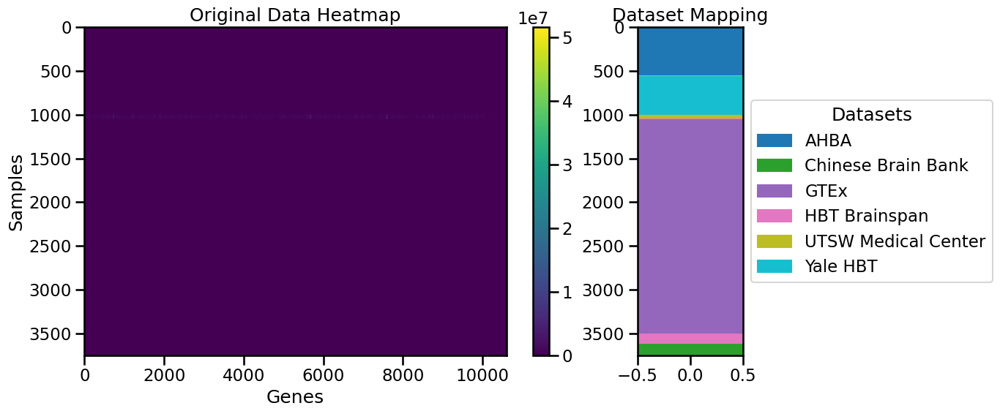

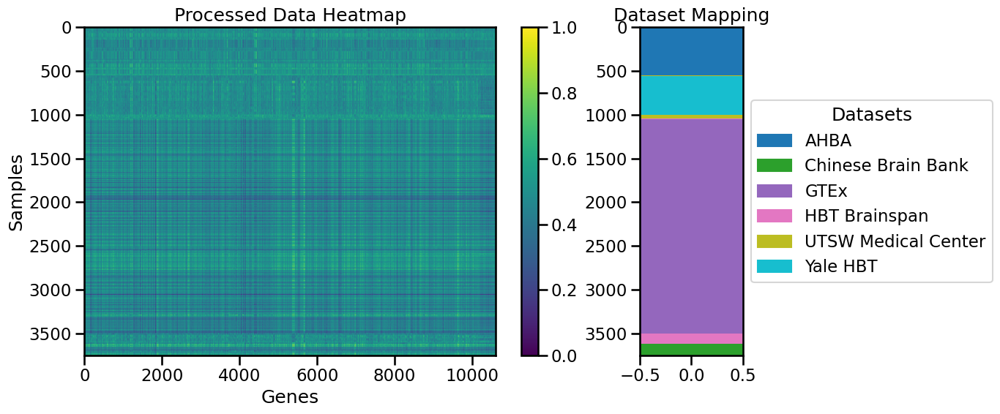

In [285]:
# Plot side-by-side heatmap for both original and processed data
harmonizer.plot_gene_expression_heatmap(view='both')

In [350]:
# Run PCA on original data
pca_original = harmonizer.run_pca(harmonizer.original_df, n_components=3)
harmonizer.plot_pca(pca_original, harmonizer.original_df, title="PCA - Original Data")

# Run PCA on processed data
pca_processed = harmonizer.run_pca(harmonized_ahba_raw, n_components=3)
harmonizer.plot_pca(pca_processed, harmonized_ahba_raw, title="PCA - Processed Data")


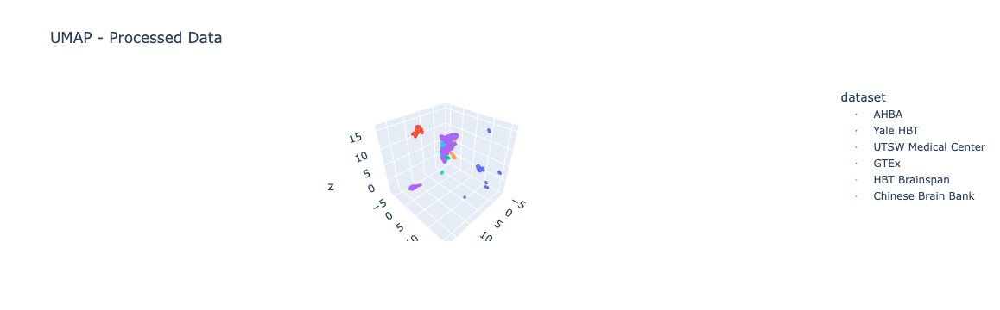

In [286]:
# Run UMAP on original data
umap_original = harmonizer.run_umap(harmonizer.original_df, n_components=3)
harmonizer.plot_umap(umap_original, harmonizer.original_df, title="UMAP - Original Data")

# Run UMAP on processed data
umap_processed = harmonizer.run_umap(harmonizer.processed_df, n_components=3)
harmonizer.plot_umap(umap_processed, harmonizer.processed_df, title="UMAP - Processed Data")


In [345]:
# Define preprocessing steps per dataset
preprocessing_steps = {
    'AHBA': ['scaled_robust_sigmoid'], 
    'Chinese Brain Bank': ['log_transform', 'min_max'],
    'UTSW Medical Center': ['log_transform', 'min_max'],
    'GTEx': ['min_max'],
    'Yale HBT': ['min_max'],
    'HBT Brainspan': ['log_transform', 'min_max']
}

harmonized_ahba_srs = harmonizer.statistical_process_gene_data(preprocessing_steps)

(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)
(3754, 10617)


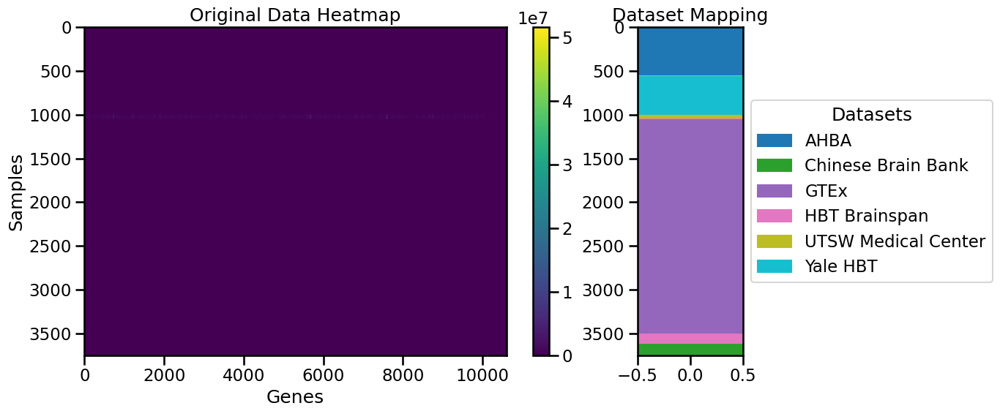

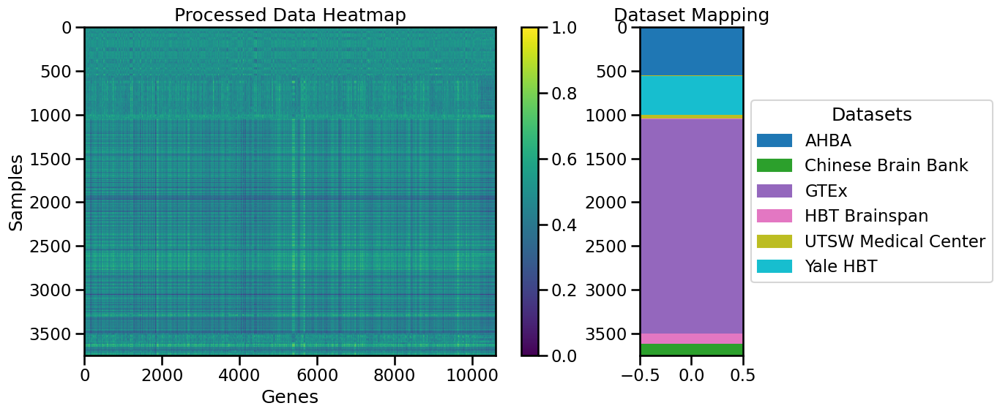

In [319]:
# Plot side-by-side heatmap for both original and processed data
harmonizer.plot_gene_expression_heatmap(view='both')

In [334]:
harmonized_ahba_srs.columns.tolist()

['ID',
 'age',
 'age decade',
 'sex',
 'ethnicity',
 'tissue sample local name',
 'tissue sample(s) in atlas name',
 'atlas',
 'centroid coordinates',
 'dataset',
 'sequencing_type',
 'A1BG',
 'A2M',
 'A2ML1',
 'A4GALT',
 'AAAS',
 'AACS',
 'AADAT',
 'AAGAB',
 'AAK1',
 'AAMP',
 'AARS',
 'AARS2',
 'AASDH',
 'AASDHPPT',
 'AASS',
 'AATF',
 'ABAT',
 'ABCA1',
 'ABCA10',
 'ABCA11P',
 'ABCA2',
 'ABCA3',
 'ABCA5',
 'ABCA6',
 'ABCA7',
 'ABCA8',
 'ABCA9',
 'ABCB1',
 'ABCB10',
 'ABCB6',
 'ABCB7',
 'ABCB8',
 'ABCB9',
 'ABCC1',
 'ABCC10',
 'ABCC12',
 'ABCC5',
 'ABCC8',
 'ABCC9',
 'ABCD2',
 'ABCD3',
 'ABCD4',
 'ABCE1',
 'ABCF1',
 'ABCF2',
 'ABCF3',
 'ABCG2',
 'ABCG4',
 'ABHD1',
 'ABHD10',
 'ABHD11',
 'ABHD12',
 'ABHD12B',
 'ABHD13',
 'ABHD14A',
 'ABHD14B',
 'ABHD2',
 'ABHD3',
 'ABHD4',
 'ABHD5',
 'ABHD6',
 'ABHD8',
 'ABI1',
 'ABI2',
 'ABI3',
 'ABL1',
 'ABL2',
 'ABLIM1',
 'ABLIM2',
 'ABLIM3',
 'ABR',
 'ABT1',
 'ABTB1',
 'ABTB2',
 'ACAA1',
 'ACAA2',
 'ACACA',
 'ACACB',
 'ACAD10',
 'ACAD11',
 'ACAD8',
 

In [355]:
# Run PCA on original data
pca_original = harmonizer.run_pca(harmonizer.original_df, n_components=3)
harmonizer.plot_pca(pca_original, harmonizer.original_df, title="PCA - Original Data", color_by='macro region')

# Run PCA on processed data
pca_processed = harmonizer.run_pca(harmonizer.processed_df, n_components=3)
harmonizer.plot_pca(pca_processed, harmonizer.processed_df, title="PCA - Processed Data", color_by='macro region')


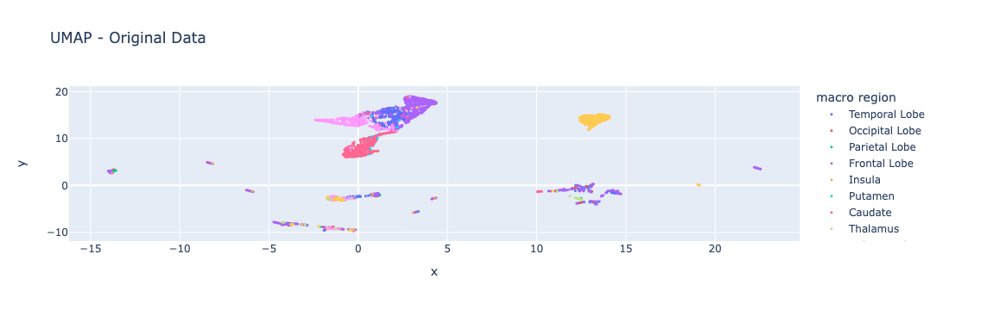

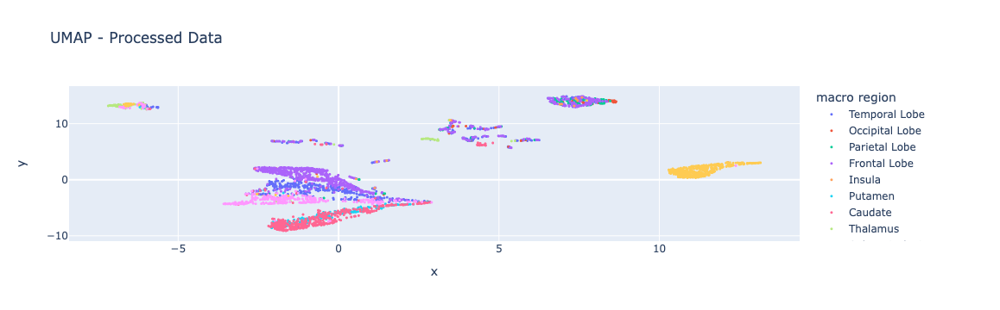

In [352]:
# Run UMAP on original data
umap_original = harmonizer.run_umap(harmonizer.original_df, n_components=2)
harmonizer.plot_umap(umap_original, harmonizer.original_df, title="UMAP - Original Data", color_by='macro region')

# Run UMAP on processed data
umap_processed = harmonizer.run_umap(harmonized_ahba_srs, n_components=2)
harmonizer.plot_umap(umap_processed, harmonized_ahba_srs, title="UMAP - Processed Data",color_by='macro region')


#### Supplementary data exploration

In [357]:
# Group by dataset and macro region, then count the occurrences of each
macro_region_table = harmonizer.original_df.groupby(['dataset', 'macro region']).size().unstack(fill_value=0)

# Display the table
macro_region_table

macro region,Caudate,Cerebellum,Frontal Lobe,Insula,Occipital Lobe,Parietal Lobe,Putamen,Subcortical Microstructure,Temporal Lobe,Thalamus,Unknown
dataset,,,,,,,,,,,
AHBA,15,33,136,7,57,109,8,45,79,64,0
Chinese Brain Bank,8,8,36,4,8,20,4,12,24,4,4
GTEx,487,448,626,0,0,0,205,340,345,0,0
HBT Brainspan,7,8,38,0,7,16,0,0,39,7,0
UTSW Medical Center,0,0,30,0,0,10,0,0,10,0,0
Yale HBT,27,25,144,0,29,56,0,0,138,27,0


Cerebellum, frontal lobe, and temporal lobe seem like well represented macro regions to compare between datasets.

Design a function that evaluates the harmonization quality for a given macro region by analyzing the distribution changes from pre and post processing of the dataset. To do this for each macro-region create a lineplot similar to the one designed in the plotting function below. 

def lineplot_gene_expression_overview(minimal_processed_df):
    # Initialize a figure and axis
    plt.figure(figsize=(10, 7))

    # Loop over each unique dataset
    for dataset in minimal_processed_df['dataset'].unique():
        # Subset the DataFrame by the current dataset
        dataset_df = minimal_processed_df[minimal_processed_df['dataset'] == dataset]

        # Get the gene columns (assuming they are from the 10th column onwards)
        gene_columns = dataset_df.columns[10:]

        # [0:1000:len(gene_columns)]
        skip_num=500
        # Calculate the median and standard deviation for each gene
        median_values = dataset_df[gene_columns].median()[0:len(gene_columns):skip_num]
        std_values = dataset_df[gene_columns].std()[0:len(gene_columns):skip_num]

        # Apply Savitzky-Golay filter to smooth the median values
        smoothed_median_values = savgol_filter(median_values, window_length=5, polyorder=2)

        # Plot the line for the median values
        plt.plot(median_values.index, smoothed_median_values, label=dataset)

        # Add the shaded area representing standard deviation with lighter transparency
        plt.fill_between(median_values.index, 
                         median_values - std_values, 
                         median_values + std_values, 
                         alpha=0.1)  # Set transparency lighter with alpha=0.15
 
    
    # Customize the plot
    plt.title(f'Smoothed Gene Expression for Every {skip_num}th Gene by Dataset')
    plt.xlabel('Genes')
    plt.ylabel('Expression Level')
    plt.legend(title='Dataset')
    plt.grid(True)
    
    # Remove x-axis labels
    plt.xticks([])

    # Show the plot
    plt.show()

The basic idea is to plot every nth gene and its std deviation across all datasets. There should be two plots per macro-region specified. One for pre and one for post.

Evaluating harmonization for macro-region: Temporal Lobe


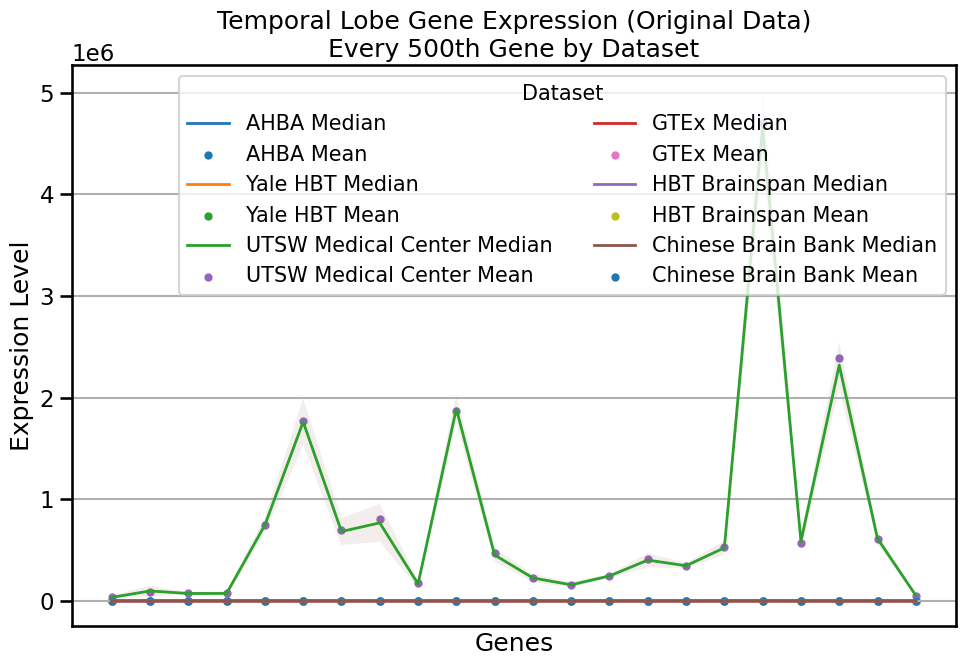

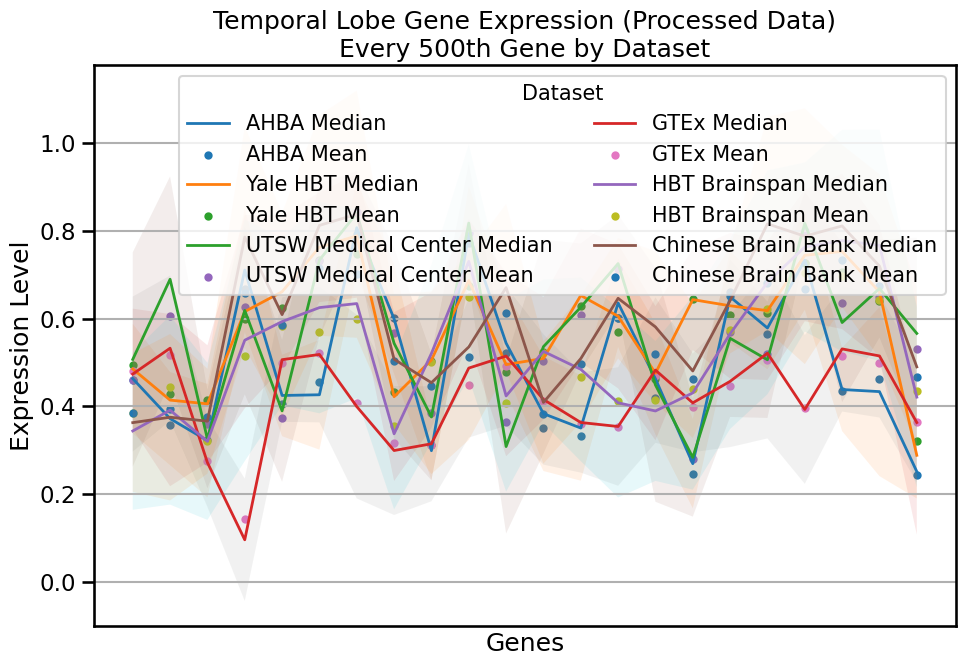

In [379]:
harmonizer.evaluate_harmonization_for_macro_region("Temporal Lobe", skip_num=500)


Evaluating harmonization for macro-region: Cerebellum


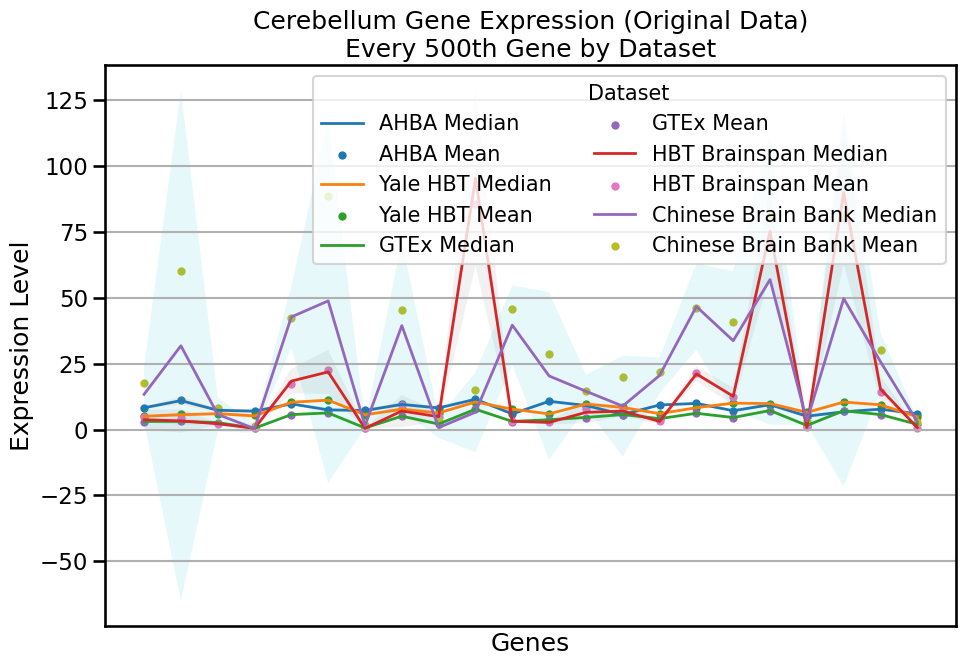

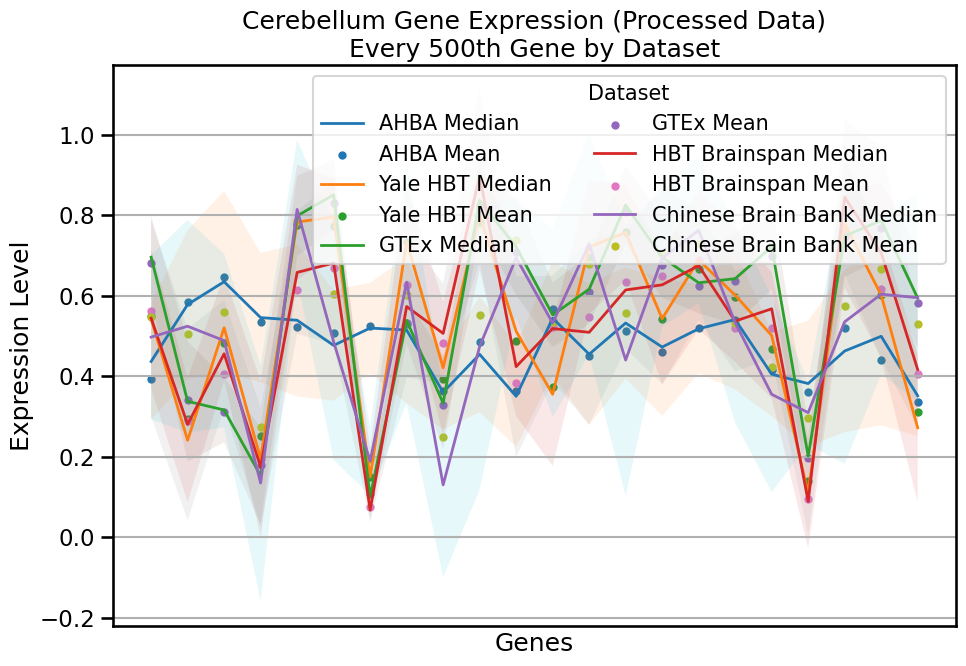

In [380]:
harmonizer.evaluate_harmonization_for_macro_region("Cerebellum", skip_num=500)


### Misc modalities

In [52]:

# Assuming raw_gene_array is already defined and all values are of type float

# Calculate the minimum value
min_value = np.min(raw_gene_array)

# Calculate the maximum value
max_value = np.max(raw_gene_array)

# Calculate the median value
median_value = np.median(raw_gene_array)

# Calculate the mean value
mean_value = np.mean(raw_gene_array)

# Print the results
print(f"Minimum value: {min_value}")
print(f"Maximum value: {max_value}")
print(f"Median value: {median_value}")
print(f"Mean value: {mean_value}")


Minimum value: 0.0
Maximum value: 51568974.0
Median value: 4.3437291098940465
Mean value: 8115.740592514519


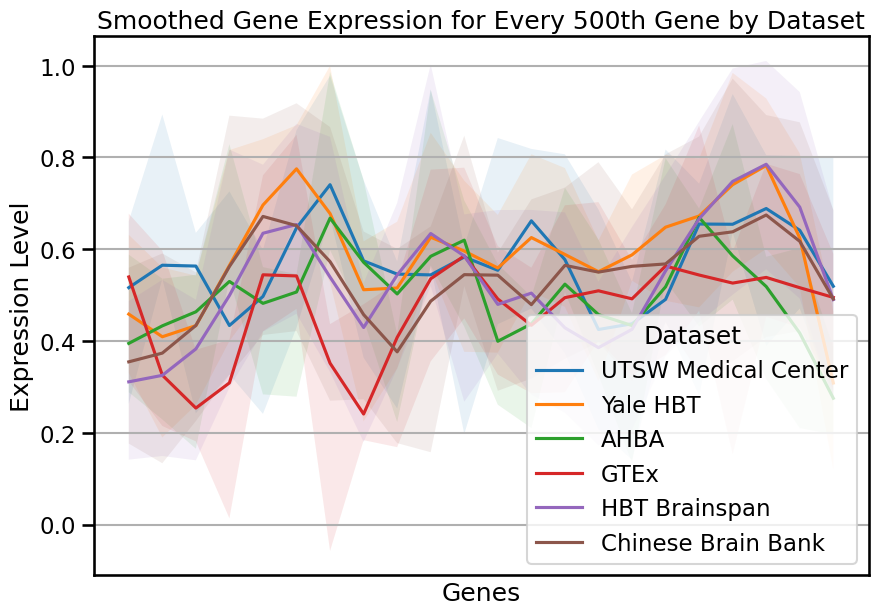

In [73]:


def lineplot_gene_expression_overview(minimal_processed_df):
    # Initialize a figure and axis
    plt.figure(figsize=(10, 7))

    # Loop over each unique dataset
    for dataset in minimal_processed_df['dataset'].unique():
        # Subset the DataFrame by the current dataset
        dataset_df = minimal_processed_df[minimal_processed_df['dataset'] == dataset]

        # Get the gene columns (assuming they are from the 10th column onwards)
        gene_columns = dataset_df.columns[10:]

        # [0:1000:len(gene_columns)]
        skip_num=500
        # Calculate the median and standard deviation for each gene
        median_values = dataset_df[gene_columns].median()[0:len(gene_columns):skip_num]
        std_values = dataset_df[gene_columns].std()[0:len(gene_columns):skip_num]

        # Apply Savitzky-Golay filter to smooth the median values
        smoothed_median_values = savgol_filter(median_values, window_length=5, polyorder=2)

        # Plot the line for the median values
        plt.plot(median_values.index, smoothed_median_values, label=dataset)

        # Add the shaded area representing standard deviation with lighter transparency
        plt.fill_between(median_values.index, 
                         median_values - std_values, 
                         median_values + std_values, 
                         alpha=0.1)  # Set transparency lighter with alpha=0.15
 
    
    # Customize the plot
    plt.title(f'Smoothed Gene Expression for Every {skip_num}th Gene by Dataset')
    plt.xlabel('Genes')
    plt.ylabel('Expression Level')
    plt.legend(title='Dataset')
    plt.grid(True)
    
    # Remove x-axis labels
    plt.xticks([])

    # Show the plot
    plt.show()

# Example usage
lineplot_gene_expression_overview(minimal_processed_df)
